In [30]:
import geopandas as gpd

# Path to the GeoJSON file
geojson_path = r"C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\HDB_TownEstate_P.geojson"

# Read the GeoJSON file using Geopandas
gdf = gpd.read_file(geojson_path)

# Save the DataFrame to CSV
csv_path = r"C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\HDB_TownEstate_P.csv"
gdf.to_csv(csv_path, index=False)

print(f"Data has been successfully saved to {csv_path}")

Data has been successfully saved to C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\HDB_TownEstate_P.csv


In [31]:
print(gdf)

    OBJECTID          NME_BNDRY           INC_CRC      FMEL_UPD_D  \
0       1284             TENGAH  84774D140145C8DA  20201007153219   
1       1281         ANG MO KIO  9C5CBD0F78C61BEB  20231101120746   
2       1282        BUKIT TIMAH  68B79B0115DBBD0D  20211019141748   
3       1283           TAMPINES  D3B7B9DB1993C0EF  20201007153219   
4       1285          TOA PAYOH  12F03406F3176DEE  20201007153219   
5       1286            HOUGANG  D38E5B7A01CA427C  20201007153219   
6       1288      CHOA CHU KANG  347FCD08E1D4313A  20201007153219   
7       1289        JURONG EAST  6DEF5BDEF9528E1E  20201007153219   
8       1287           SENGKANG  5EA918FB8336FB9D  20201007153219   
9       1290          SEMBAWANG  8F906E00AAFB6F5F  20201007153219   
10      1291              BEDOK  11D22FE0A4F6000C  20231101120746   
11      1292  KALLANG / WHAMPOA  B72425ED025C3E8C  20231101120746   
12      1293            GEYLANG  F074C206E54ACE0B  20231101120746   
13      1294         QUEENSTOWN  2

In [32]:
# Create a dictionary from the GeoDataFrame
polygons = {row['NME_BNDRY']: row['geometry'] for index, row in gdf.iterrows()}

# Print the dictionary to verify
for name, poly in polygons.items():
    print(f"Estate Name: {name}, Polygon: {poly}")

Estate Name: TENGAH, Polygon: POLYGON ((103.73726409671126 1.3460030369359102, 103.73756361235208 1.3465011150627062, 103.73780323134272 1.3468969109372575, 103.73792937190298 1.3471351640634446, 103.73813961238179 1.347558748930078, 103.73824767963588 1.347974962827046, 103.73827272978328 1.348066027759193, 103.73828714199398 1.348176998211674, 103.73829174034681 1.348305308538506, 103.73826319134761 1.3488125801071809, 103.73818709612345 1.349243280988103, 103.73807276473055 1.3497571636818897, 103.73804442452771 1.3498845457360067, 103.7378979448854 1.3503377868823694, 103.73777098231066 1.3507818350307363, 103.73764454038627 1.351168859473509, 103.73699200766737 1.3528898863090515, 103.73675126550899 1.353506021984901, 103.73662049197158 1.353852972936009, 103.73657887792533 1.3540743050928736, 103.73651645446523 1.3544661233268582, 103.73651050298933 1.3546545552795266, 103.73650752099083 1.3549177637099077, 103.7365164290571 1.3551061971637655, 103.73654613894048 1.35531556745973

In [33]:
# Converting x and y to coordinates for latitude/longitude
import rasterio
import numpy as np
import pandas as pd
from pyproj import Transformer
from shapely.geometry import Point

global filtered_df

def preprocessing_sg(file_path, singapore_geojson_path):   
    global filtered_df
    
    # Open your GeoTIFF file
    with rasterio.open(file_path) as src:
        array = src.read()
        transform = src.transform
        src_crs = src.crs  # Source CRS
        # dest_crs = 'EPSG:4326'  # WGS 84

        # Create a transformer object to convert from src_crs to dest_crs
        transformer = Transformer.from_crs(src_crs, 'EPSG:4326', always_xy=True)

        # Get arrays of column and row indices
        cols, rows = np.meshgrid(np.arange(array.shape[2]), np.arange(array.shape[1]))
        
        # Convert meshgrid arrays to coordinate arrays using rasterio's method, which are 2D
        xs, ys = rasterio.transform.xy(transform, rows, cols, offset='center')
        
        # Flatten the coordinate arrays to pass to transform function
        lon, lat = transformer.transform(np.array(xs).flatten(), np.array(ys).flatten())

        # Create DataFrame and convert to GeoDataFrame
        df = pd.DataFrame({'Longitude': lon, 'Latitude': lat})
        for i, band in enumerate(src.read(masked=True)):
            df[src.descriptions[i]] = band.flatten()

        # # Convert 'SR_QA_AEROSOL' to integer for bitwise operation
        # df['SR_QA_AEROSOL'] = df['SR_QA_AEROSOL'].astype(int)

        # # Filter out pixels with valid aerosol retrieval and high aerosol level
        # # Assuming 'SR_QA_AEROSOL' is the name of the QA aerosol band in the data
        # valid_aerosol = (df['SR_QA_AEROSOL'] & 2) == 2  # Bit 1 must be set for valid retrieval
        # high_aerosol = (df['SR_QA_AEROSOL'] & 192) == 192  # Bits 6-7 must be set to 11 for high aerosol
        # filter_mask = valid_aerosol & high_aerosol
        # df_filtered = df[-filter_mask]

        df_filtered = df
        
        # Scale and offset specific bands
        df_filtered['ST_B10_Celsius'] = df_filtered['ST_B10'] * 0.00341802 + 149 - 273.15
        df_filtered = df_filtered[df_filtered['ST_B10_Celsius'] >= 20]  # Drop rows below 20 degrees Celsius
        
        bands_to_scale = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7']
        for band in bands_to_scale:
            df_filtered[f"{band}_Scaled"] = df_filtered[band] * 2.75e-05 - 0.2

        additional_scales = {
            'ST_ATRAN': 0.0001, 'ST_CDIST': 0.01, 'ST_DRAD': 0.001, 
            'ST_EMIS': 0.0001, 'ST_EMSD': 0.0001, 'ST_QA': 0.01, 
            'ST_TRAD': 0.001, 'ST_URAD': 0.001
        }

        for band, scale in additional_scales.items():
            df_filtered[f"{band}_Scaled"] = df_filtered[band] * scale

        gdf = gpd.GeoDataFrame(df_filtered, geometry=gpd.points_from_xy(df_filtered.Longitude, df_filtered.Latitude))
        gdf.set_crs('EPSG:4326', inplace=True)

        print("Total number of valid pixels: " + str(len(gdf)))
        print(df[['Latitude', 'Longitude']].head())

        gdf = gdf.to_crs('EPSG:3857')

        # Read the Singapore boundary GeoJSON, convert to Web Mercator
        singapore_boundary = gpd.read_file(singapore_geojson_path)
        singapore_boundary = singapore_boundary.to_crs('EPSG:3857')  # Ensure the CRS matches

        # Perform spatial join to filter points within Singapore
        filtered_gdf = gpd.sjoin(gdf, singapore_boundary, how="inner", op='within')

        # Print the total number of valid pixels within Singapore
        print("Total number of valid pixels within Singapore: " + str(len(filtered_gdf)))

        filtered_gdf = filtered_gdf.to_crs('EPSG:4326')

    return filtered_gdf

In [38]:
import geopandas as gpd
import hvplot.pandas
import pandas as pd
from shapely.geometry import Polygon, box
import panel as pn
from bokeh.palettes import Inferno256
import numpy as np
import logging

# Suppress warnings
logging.getLogger('bokeh').setLevel(logging.ERROR)
pd.options.mode.chained_assignment = None  # default='warn'

global within_polygon_gdf

def filtered_sg(filtered_gdf): 
    global within_polygon_gdf
    
    filtered_gdf = filtered_gdf.to_crs('epsg:3857')

    # print(filtered_gdf['geometry'])

    # Create pixels as 30m x 30m boxes around each point
    # Assuming each point is at the center of the pixel
    half_width = 15  # half the width of the pixel in meters since the EPSG:3857 coordinate system is in metres
    filtered_gdf['geometry'] = filtered_gdf['geometry'].apply(lambda x: box(x.x - half_width, x.y - half_width, x.x + half_width, x.y + half_width))

    #print(filtered_gdf['geometry'])

    # Create a GeoDataFrame from all polygons and convert CRS to match
    polygon_gdf = gpd.GeoDataFrame({'geometry': list(polygons.values()), 'Estate Name': list(polygons.keys())}, crs='epsg:4326')
    polygon_gdf_3857 = polygon_gdf.to_crs('epsg:3857')

    # print(polygon_gdf_3857['geometry'])

    # Filter points that intersect each polygon and track hawker centre name
    within_polygon_gdf = pd.DataFrame()  # initialize an empty dataframe
    for idx, row in polygon_gdf_3857.iterrows():
        intersects = filtered_gdf['geometry'].apply(lambda geom: geom.intersects(row['geometry']))
        if intersects.any():
            current_data = filtered_gdf[intersects].copy()
            current_data['ESTATE_BOUNDARY'] = row['Estate Name']  # append the name of the hawker centre
            within_polygon_gdf = pd.concat([within_polygon_gdf, current_data], ignore_index=True)

    print("Number of pixels in regions of interest: " + str(len(within_polygon_gdf)))
    print(within_polygon_gdf)

    return within_polygon_gdf

In [41]:
# DOWNLOADING LANDSAT 9 DATA

import geopandas as gpd
import pandas as pd
import os
import zipfile
from datetime import datetime
import logging
import shutil

singapore_geojson_path = r"C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\HDB_TownEstate_P.geojson"

# Required data is from 2022 - 2024
year = "2024"

# Suppress warnings
logging.getLogger('bokeh').setLevel(logging.ERROR)
pd.options.mode.chained_assignment = None  # default='warn'

# Specify the zip file and temporary directory for extraction
zip_file_path = f"C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\Landsat9\\{year}.zip"
temp_dir = f"C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\temp_extract"

# Create a temporary directory if it doesn't exist
os.makedirs(temp_dir, exist_ok=True)

# Extract the .tif files from the zip
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(temp_dir)

# Initialize an empty list to hold all the GeoDataFrames
gdfs = []

# Walk through the temporary directory and process each .tif file
for filename in os.listdir(f"{temp_dir}\\{year}"):
    if filename.endswith(".tif"):
        print("Currently processing: " + filename)
        file_path = os.path.join(f"{temp_dir}\\{year}", filename)
        
        # Extract the time period from the filename
        # Assuming filename format is "L8_UTC_YYYYMMDD_hhmmss.tif"
        time_str = filename.split('_')[2]
        time_obj = datetime.strptime(time_str, "%Y%m%d")
        
        # Load and preprocess the GeoDataFrame
        gdf = preprocessing_sg(file_path, singapore_geojson_path)
        gdf['time'] = time_obj  # Append the datetime object as a new column
        
        # Append the processed GeoDataFrame to the list
        gdfs.append(gdf)

# Combine all GeoDataFrames into one
combined_gdf_sg = pd.concat(gdfs)

shutil.rmtree(f"C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\temp_extract")

# Use the combined GeoDataFrame as needed
print(combined_gdf_sg)

Currently processing: L9_UTC_20240109_031653.tif
Total number of valid pixels: 80849
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 26
Currently processing: L9_UTC_20240125_031651.tif
Total number of valid pixels: 526061
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 105849
Currently processing: L9_UTC_20240210_031656.tif
Total number of valid pixels: 0
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830
Total number of valid pixels within Singapore: 0
Currently processing: L9_UTC_20240226_031644.tif


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels: 95904
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 1325
Currently processing: L9_UTC_20240313_031647.tif
Total number of valid pixels: 2108564
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 190871
Currently processing: L9_UTC_20240329_031638.tif
Total number of valid pixels: 1672100
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 155468
Currently processing: L9_UTC_20240430_031614.tif
Total number of valid pixels: 430079
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


Total number of valid pixels within Singapore: 6797
Currently processing: L9_UTC_20240516_031607.tif
Total number of valid pixels: 374
   Latitude   Longitude
0  1.470099  103.589751
1  1.470099  103.590021
2  1.470099  103.590290
3  1.470099  103.590560
4  1.470100  103.590830
Total number of valid pixels within Singapore: 0


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3508: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


         Longitude  Latitude    SR_B1    SR_B2    SR_B3    SR_B4    SR_B5  \
743968  103.825457  1.357079  10294.0  10181.0  12317.0  12197.0  19303.0   
743969  103.825727  1.357079  10485.0  10361.0  12894.0  12567.0  19504.0   
743970  103.825996  1.357079   8904.0   8772.0  11274.0  11241.0  18249.0   
743971  103.826266  1.357079   7489.0   7417.0   9445.0   9743.0  17016.0   
743972  103.826536  1.357079   6304.0   6420.0   7894.0   8318.0  15786.0   
...            ...       ...      ...      ...      ...      ...      ...   
814895  103.730288  1.346176   6096.0   6838.0   8380.0   8306.0  10537.0   
816676  103.730019  1.345905   6631.0   7309.0   8714.0   8570.0  10688.0   
816677  103.730289  1.345905   6661.0   7296.0   8695.0   8569.0  10767.0   
816678  103.730558  1.345905   6654.0   7277.0   8653.0   8667.0  10969.0   
818460  103.730558  1.345634   7090.0   7676.0   8769.0   9008.0  11140.0   

          SR_B6    SR_B7  SR_QA_AEROSOL  ...  ST_URAD_Scaled  \
743968  153

In [42]:
# Filter data for the date '2022-04-01'
specific_date_gdf = combined_gdf_sg[combined_gdf_sg['time'].dt.date == pd.to_datetime('2024-03-13').date()]

print("Total number of valid pixels: " + str(len(specific_date_gdf)))

all_estates_filtered_df = filtered_sg(specific_date_gdf)

# Filtered dataframe for specific date, with name of hawker centre attached to pixels
print(all_estates_filtered_df)

Total number of valid pixels: 190871
Number of pixels in regions of interest: 192769
         Longitude  Latitude   SR_B1    SR_B2    SR_B3    SR_B4    SR_B5  \
0       103.732968  1.378740  8878.0   9441.0  10895.0  11191.0  14801.0   
1       103.733237  1.378469  8409.0   8946.0   9936.0  10123.0  13836.0   
2       103.733507  1.378198  7419.0   7760.0   8590.0   8284.0  10114.0   
3       103.733777  1.377926  7287.0   7673.0   8592.0   8335.0  10304.0   
4       103.734047  1.377655  7168.0   7570.0   8578.0   8315.0  10454.0   
...            ...       ...     ...      ...      ...      ...      ...   
192764  103.770182  1.363835  9183.0   9637.0  10604.0  10733.0  15713.0   
192765  103.767756  1.363563  9372.0  10118.0  11562.0  11873.0  14811.0   
192766  103.768025  1.363563  8729.0   9347.0  10832.0  10892.0  16250.0   
192767  103.768295  1.363563  8592.0   9206.0  10515.0  10586.0  15735.0   
192768  103.768565  1.363563  8581.0   9230.0  10543.0  10658.0  15900.0   

  

In [61]:
import pandas as pd

# Assuming combined_gdf_sg is defined and valid
unique_dates = combined_gdf_sg['time'].dt.date.unique()  # Get unique dates

# Exclude '2022-04-01' from processing
unique_dates = [date for date in unique_dates if date != pd.to_datetime('2024-03-13').date()]

# Initialize an empty DataFrame to collect all data for 2022
all_data_2022 = pd.DataFrame()

for date in unique_dates:
    # Filter data for the current date
    specific_date_gdf = combined_gdf_sg[combined_gdf_sg['time'].dt.date == date]

    if len(specific_date_gdf) == 0:
        print(f"No valid pixels for date {date}. Skipping...")
        continue

    # Process the filtered GeoDataFrame for the specific date
    all_estates_filtered_df_2 = filtered_sg(specific_date_gdf)

    # Check if any data was returned after filtering
    if all_estates_filtered_df_2.empty:
        print(f"No valid pixels found for date {date}.")
    else:
        print(f"Finished processing date {date}. Number of pixels in regions of interest: {len(all_estates_filtered_df_2)}")

    # Append the data from this date to the cumulative DataFrame for the year
    all_data_2022 = pd.concat([all_data_2022, all_estates_filtered_df_2], ignore_index=True)

all_data_2022 = pd.concat([all_data_2022, all_estates_filtered_df], ignore_index=True)

# Print the total collected data for 2022
print(f"Total data collected for 2024: {len(all_data_2022)}")

Number of pixels in regions of interest: 26
     Longitude  Latitude    SR_B1    SR_B2    SR_B3    SR_B4    SR_B5  \
0   103.825457  1.357079  10294.0  10181.0  12317.0  12197.0  19303.0   
1   103.825727  1.357079  10485.0  10361.0  12894.0  12567.0  19504.0   
2   103.825996  1.357079   8904.0   8772.0  11274.0  11241.0  18249.0   
3   103.826266  1.357079   7489.0   7417.0   9445.0   9743.0  17016.0   
4   103.826536  1.357079   6304.0   6420.0   7894.0   8318.0  15786.0   
5   103.825188  1.356807   8202.0   7910.0  10485.0  10660.0  18259.0   
6   103.825457  1.356808   9184.0   8924.0  11712.0  11498.0  18893.0   
7   103.825727  1.356808   9189.0   8742.0  12264.0  11521.0  18900.0   
8   103.825997  1.356808   6920.0   6547.0  10154.0   9978.0  17071.0   
9   103.826266  1.356808   6732.0   6366.0   9212.0   9432.0  16562.0   
10  103.826536  1.356808   7579.0   7388.0   9299.0   9839.0  16693.0   
11  103.825188  1.356536   6698.0   6377.0  10743.0   9957.0  17225.0   
12  103

ValueError: Cannot determine common CRS for concatenation inputs, got ['WGS 84 / Pseudo-Mercator', 'WGS 84']. Use `to_crs()` to transform geometries to the same CRS before merging.

In [ ]:
# Specify the file path where you want to save the CSV
output_csv_path = "C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\FilteredData\\HawkerCentres\\Landsat9\\all_data_2024.csv"

# Save the DataFrame to CSV
all_data_2022.to_csv(output_csv_path, index=False)

print(f"Data successfully saved to {output_csv_path}")

In [60]:
import pandas as pd
import geopandas as gpd
import hvplot.pandas  # Import hvplot extensions for Pandas

# Assuming 'df' is your DataFrame already loaded with data
# Convert DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(all_estates_filtered_df, geometry=gpd.points_from_xy(all_estates_filtered_df.Longitude, all_estates_filtered_df.Latitude))
gdf.crs = 'EPSG:4326'  # Ensure CRS is set for lat-long

# Filter data for a specific date
specific_date = pd.Timestamp('2024-03-13')
gdf = gdf[gdf['time'] == specific_date]

# Load the boundaries for the regions
boundaries = gpd.read_file(r"C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\HDB_TownEstate_P.geojson")
boundaries.crs = 'EPSG:4326'

# Check and drop 'index_left' and 'index_right' if they exist
if 'index_left' in gdf.columns:
    gdf = gdf.drop(columns=['index_left'])
if 'index_right' in gdf.columns:
    gdf = gdf.drop(columns=['index_right'])
if 'index_left' in boundaries.columns:
    boundaries = boundaries.drop(columns=['index_left'])
if 'index_right' in boundaries.columns:
    boundaries = boundaries.drop(columns=['index_right'])

# Perform a spatial join to associate points with their respective regions
gdf = gpd.sjoin(gdf, boundaries, how='inner', op='intersects')

# Plot using hvplot
points_plot = gdf.hvplot(
    geo=True,  # Enable geographic context
    c='ST_B10_Celsius',  # Use ST_B10_Celsius as the color dimension
    hover_cols=['ESTATE_BOUNDARY', 'ST_B10_Celsius'],  # Show these columns on hover
    tiles='OSM',  # Use OpenStreetMap base tiles
    cmap='viridis',  # Color map
    colorbar=True,  # Show color bar
    alpha=0.5,  # Transparency of the points
    size=10,  # Size of the points
    frame_width=700,
    frame_height=500
)

# Plot the boundaries
boundaries_plot = boundaries.hvplot(
    geo=True,  # Geographic context
    color=None,  # No fill
    line_color='red',  # Red lines for the boundaries
    line_width=2,  # Line width
    alpha=0.7  # Line transparency
)

# Overlay the points on the boundaries
overlay_map = boundaries_plot * points_plot

# Display the plot
overlay_map

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


:Overlay
   .Polygons.I :Polygons   [Longitude,Latitude]
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Points.I   :Points   [Longitude,Latitude]   (ST_B10_Celsius,ESTATE_BOUNDARY)

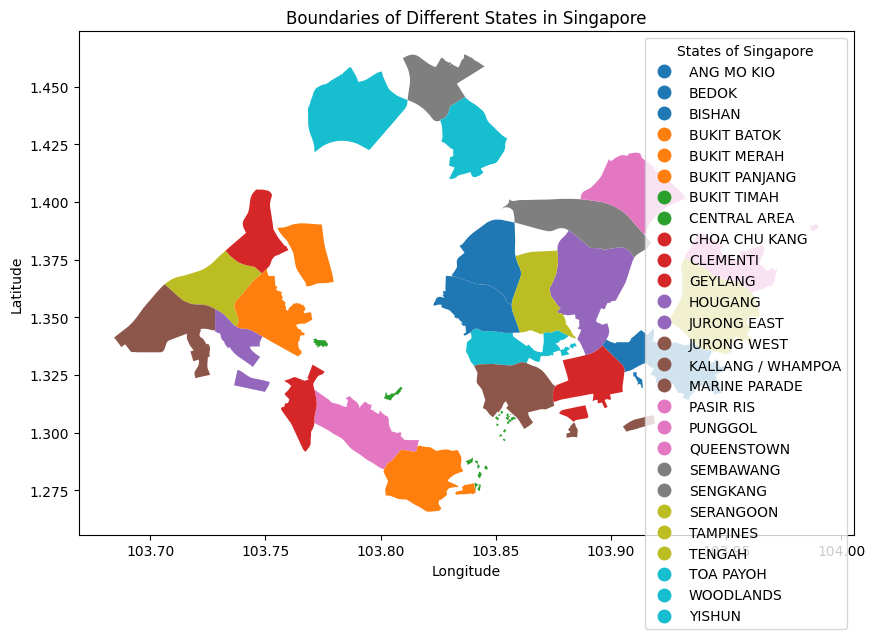

In [4]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming your file path is correctly specified
file_path = "C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\HDB_TownEstate_P.geojson"

# Load the GeoJSON file into a GeoDataFrame
gdf = gpd.read_file(file_path)

# Plotting the state boundaries
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust size as needed
gdf.plot(ax=ax, column='NME_BNDRY', legend=True, legend_kwds={'title': "States of Singapore"})
plt.title('Boundaries of Different States in Singapore')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Display the plot
plt.show()

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


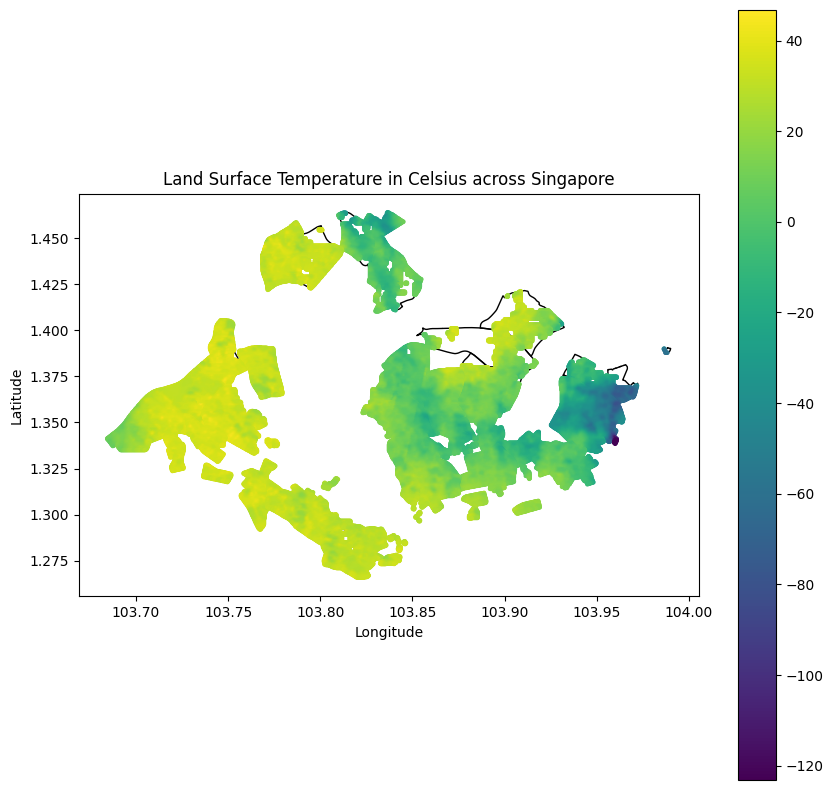

In [16]:
import geopandas as gpd
import pandas as pd
import rasterio
import numpy as np
from rasterio.io import MemoryFile
import zipfile
from rasterstats import zonal_stats
from shapely.geometry import Point
import matplotlib.pyplot as plt
from pyproj import Transformer

# Paths to your data
zip_file_path = r"C:\LocalOneDrive\Documents\Desktop\MTI\UHI-Project\MSE-ES-UHI\Data\Landsat8\2022.zip"
tif_file_name = "2022/L8_UTC_20220111_031652.tif"  # Modify this based on your actual path
geojson_path = "C:\\LocalOneDrive\\Documents\\Desktop\\MTI\\UHI-Project\\MSE-ES-UHI\\Data\\HDB_TownEstate_P.geojson"

with zipfile.ZipFile(zip_file_path, 'r') as z:
    with z.open(tif_file_name) as file:
        with MemoryFile(file.read()) as memfile:
            with memfile.open() as src:
                # Assuming ST_B10 is the band for LST and it's the 10th band, adjust if necessary
                band_index = src.indexes.index(10)  # find the index of ST_B10
                array = src.read(band_index)
                transform = src.transform
                crs = src.crs
                
                # Convert coordinates
                transformer = Transformer.from_crs(crs, 'EPSG:4326', always_xy=True)
                cols, rows = np.meshgrid(np.arange(array.shape[1]), np.arange(array.shape[0]))
                xs, ys = rasterio.transform.xy(transform, rows.flatten(), cols.flatten(), offset='center')
                lon, lat = transformer.transform(xs, ys)
                
                # Convert Kelvin to Celsius
                lst_celsius = (array.flatten() * 0.00341802 + 149 - 273.15).astype(float)
                
                df = pd.DataFrame({
                    'Longitude': lon,
                    'Latitude': lat,
                    'LST_Celsius': lst_celsius
                })

# Load and prepare GeoJSON
singapore_gdf = gpd.read_file(geojson_path)
points_gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
points_gdf.crs = 'EPSG:4326'

# Spatial join to filter points within Singapore
filtered_gdf = gpd.sjoin(points_gdf, singapore_gdf, how='inner', op='intersects')

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
singapore_gdf.plot(ax=ax, color='none', edgecolor='black')
filtered_gdf.plot(ax=ax, column='LST_Celsius', legend=True, cmap='viridis', markersize=5)
plt.title('Land Surface Temperature in Celsius across Singapore')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [27]:
print(singapore_gdf)

    OBJECTID          NME_BNDRY           INC_CRC      FMEL_UPD_D  \
0       1284             TENGAH  84774D140145C8DA  20201007153219   
1       1281         ANG MO KIO  9C5CBD0F78C61BEB  20231101120746   
2       1282        BUKIT TIMAH  68B79B0115DBBD0D  20211019141748   
3       1283           TAMPINES  D3B7B9DB1993C0EF  20201007153219   
4       1285          TOA PAYOH  12F03406F3176DEE  20201007153219   
5       1286            HOUGANG  D38E5B7A01CA427C  20201007153219   
6       1288      CHOA CHU KANG  347FCD08E1D4313A  20201007153219   
7       1289        JURONG EAST  6DEF5BDEF9528E1E  20201007153219   
8       1287           SENGKANG  5EA918FB8336FB9D  20201007153219   
9       1290          SEMBAWANG  8F906E00AAFB6F5F  20201007153219   
10      1291              BEDOK  11D22FE0A4F6000C  20231101120746   
11      1292  KALLANG / WHAMPOA  B72425ED025C3E8C  20231101120746   
12      1293            GEYLANG  F074C206E54ACE0B  20231101120746   
13      1294         QUEENSTOWN  2

In [24]:
filtered_gdf = filtered_gdf[filtered_gdf['LST_Celsius'] >= 20]

print(filtered_gdf)

          Longitude  Latitude  LST_Celsius                   geometry  \
145167   103.812200  1.448249    20.292114  POINT (103.81220 1.44825)   
146949   103.812200  1.447978    22.117340  POINT (103.81220 1.44798)   
146950   103.812470  1.447978    20.408325  POINT (103.81247 1.44798)   
148731   103.812200  1.447706    23.098297  POINT (103.81220 1.44771)   
148732   103.812470  1.447706    21.580719  POINT (103.81247 1.44771)   
...             ...       ...          ...                        ...   
1342710  103.822804  1.265901    33.140442  POINT (103.82280 1.26590)   
1342711  103.823073  1.265901    33.119934  POINT (103.82307 1.26590)   
1342712  103.823343  1.265901    33.113098  POINT (103.82334 1.26590)   
1342713  103.823612  1.265901    33.109680  POINT (103.82361 1.26590)   
1342714  103.823882  1.265901    33.113098  POINT (103.82388 1.26590)   

         index_right  OBJECTID    NME_BNDRY           INC_CRC      FMEL_UPD_D  \
145167             9      1290    SEMBAWAN

In [26]:
import geopandas as gpd
import pandas as pd
import hvplot.pandas
import panel as pn
from shapely.geometry import box
from bokeh.palettes import Inferno256
import numpy as np

# Suppress unnecessary logging
import logging
logging.getLogger('bokeh').setLevel(logging.ERROR)
pd.options.mode.chained_assignment = None  # Avoid setting with copy warning

def plot_spatial_map(filtered_gdf):
    # Convert CRS for plotting
    filtered_gdf = filtered_gdf.to_crs('epsg:3857')

    # Assuming each point is centered, create 30m x 30m squares around each point
    half_width = 15  # half the width of the pixel in meters
    filtered_gdf['geometry'] = filtered_gdf['geometry'].apply(
        lambda x: box(x.x - half_width, x.y - half_width, x.x + half_width, x.y + half_width)
    )

    # Create a custom color scale
    custom_palette = Inferno256  # Directly using Inferno256 here for simplicity

    # Create the heatmap and polygons plot
    heatmap = filtered_gdf.hvplot.points(
        'Longitude', 'Latitude', geo=True, c='LST_Celsius', cmap=custom_palette, size=200,
        tiles='OSM', frame_width=700, frame_height=500, colorbar=True, clim=(20, 40)
    )

    squares_plot = filtered_gdf.hvplot.polygons(
        'geometry', c='LST_Celsius', cmap=custom_palette, alpha=0.5, colorbar=True, clim=(20, 40)
    )

    # Combine plots
    overlay_map = heatmap * squares_plot

    return overlay_map

# Panel setup for interaction
def create_interactive_plot(gdf):
    unique_dates = pd.to_datetime(gdf['time']).dt.date.unique()
    date_slider = pn.widgets.Select(name='Select Date', options=list(unique_dates))

    @pn.depends(date_slider.param.value)
    def update_plot(selected_date):
        filtered_data = gdf[gdf['time'].dt.date == selected_date]
        return plot_spatial_map(filtered_data)

    return pn.Column(date_slider, update_plot)

# Serve the interactive plot
layout = create_interactive_plot(filtered_gdf)
pn.serve(layout, show=True)

BokehModel(combine_events=True, render_bundle={'docs_json': {'cdb2a951-6026-4c5c-b01e-550936e7ad3e': {'version…